In [6]:
import requests
from io import BytesIO
from collections import OrderedDict
from matplotlib import pyplot as plt
import numpy as np
import cv2

Functions for wokring with images

In [7]:
def get_cv2_hists(image):
    # image - image in rgb color space
    # as a base code was taken from here 
    # https://stackoverflow.com/questions/57385640/how-to-extract-color-features-via-histogram-from-a-masked-image
    # and refactored
    colors = ("red", "green", "blue")
    channels = cv2.split(image)
    return {color: cv2.calcHist([channel], [0], None, [255], [1, 256]) for  channel, color in zip(channels, colors)}


In [8]:
def read_img(url):
    response = requests.get(url)
    img_bytes = BytesIO(response.content)
    return cv2.cvtColor(cv2.imdecode(np.fromstring(img_bytes.read(), np.uint8), cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)

In [9]:
def get_dataset(count):
    source_url = "https://www.ee.columbia.edu/~rj2349/index_files/Homework1/ukbench"
    dataset = list()
    for i in range(count):
        if (i + 1) % 10 == 0:
            print(f"read {i + 1} from {count}")
        sufix = f"00000{i}"
        sufix = sufix[len(sufix) - 5:]
        url = f"{source_url}{sufix}.jpg"
        dataset.append(read_img(url))
    return dataset

In [120]:
def get_diff(data, img, func, printing=True):
    res = list()
    hists = get_hists(img)
    
    for idx, im in enumerate(data):
        hists_ = get_hists(im)
        diff = []
        for channel in ["red", "green", "blue"]:
            diff.append(L2norm(hists[channel], hists_[channel]))
        if printing and (idx + 1) % 10 == 0:
            print(f"read {idx + 1} from {len(data)}")
        res.append((func(np.array(diff)), idx))
    return res

In [58]:
def fin_top_k(diff, k=10):
    # avoid the same img
    return sorted(diff, key=lambda tup: tup[0])[1:k+1]

In [59]:
def get_hists(image):
    hist = dict()
    for idx, channel in enumerate(["red", "green", "blue"]):
        channel_hist = [0]*255
        for pix_value in range(0, 255):
            channel_hist[pix_value] = np.array([np.sum(image[:,:,idx] == pix_value + 1)])
        hist[channel] = np.array(channel_hist)
    return hist

In [63]:
def L2norm(vect1, vect2):
    return np.linalg.norm(vect1 - vect2)

In [142]:
def draw_pr_curve(data, samples, true_class):
    num_relevant_images = 3
    for i, sample in enumerate(samples):
        diff = get_diff(data, sample, np.mean, False)
        top_k = fin_top_k(diff, -2)
        # save location of all true value
        location = [idx + 1 for idx, result in enumerate(top_k) if result[1]//4 == true_class[i]]
        precision = np.arange(1, num_relevant_images + 1) / np.array(location)

        recall = np.arange(0, num_relevant_images) / num_relevant_images
        plt.plot(recall, precision)
        plt.title(f"Precision Recall Curve")
        plt.xlabel('Recall')
        plt.ylabel('Precision')


Read the first 2k images

In [54]:
dataset = get_dataset(2000)

/var/folders/h2/s6rq_mhx67n824_sv70qztxc0000gn/T/ipykernel_1557/1781875124.py:4: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  return cv2.cvtColor(cv2.imdecode(np.fromstring(img_bytes.read(), np.uint8), cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)


read 10 from 2000
read 20 from 2000
read 30 from 2000
read 40 from 2000
read 50 from 2000
read 60 from 2000
read 70 from 2000
read 80 from 2000
read 90 from 2000
read 100 from 2000
read 110 from 2000
read 120 from 2000
read 130 from 2000
read 140 from 2000
read 150 from 2000
read 160 from 2000
read 170 from 2000
read 180 from 2000
read 190 from 2000
read 200 from 2000
read 210 from 2000
read 220 from 2000
read 230 from 2000
read 240 from 2000
read 250 from 2000
read 260 from 2000
read 270 from 2000
read 280 from 2000
read 290 from 2000
read 300 from 2000
read 310 from 2000
read 320 from 2000
read 330 from 2000
read 340 from 2000
read 350 from 2000
read 360 from 2000
read 370 from 2000
read 380 from 2000
read 390 from 2000
read 400 from 2000
read 410 from 2000
read 420 from 2000
read 430 from 2000
read 440 from 2000
read 450 from 2000
read 460 from 2000
read 470 from 2000
read 480 from 2000
read 490 from 2000
read 500 from 2000
read 510 from 2000
read 520 from 2000
read 530 from 2000
re

Define the urls for images which we will ue for experiments

In [125]:
url4 = 'https://www.ee.columbia.edu/~rj2349/index_files/Homework1/ukbench00004.jpg'
url40 = 'https://www.ee.columbia.edu/~rj2349/index_files/Homework1/ukbench00040.jpg'
url60 = 'https://www.ee.columbia.edu/~rj2349/index_files/Homework1/ukbench00060.jpg'
url588 = 'https://www.ee.columbia.edu/~rj2349/index_files/Homework1/ukbench00588.jpg'
ur1562 = 'https://www.ee.columbia.edu/~rj2349/index_files/Homework1/ukbench01562.jpg'


/var/folders/h2/s6rq_mhx67n824_sv70qztxc0000gn/T/ipykernel_1557/1781875124.py:4: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  return cv2.cvtColor(cv2.imdecode(np.fromstring(img_bytes.read(), np.uint8), cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)


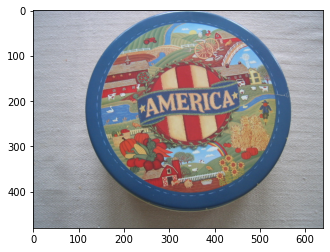

In [126]:
experiment_img = read_img(url4)
plt.imshow(experiment_img)

Let's read the image and compare histogram methods

In [62]:
cv_hist = get_cv2_hists(experiment_img)
own_hist = get_hists(experiment_img)

In [64]:
print(f"L2 norm for the same img but using different methods for red chennel \
      {L2norm(cv_hist['red'], own_hist['red'])}")



L2 norm for the same img but using different methods for red chennel       0.0


Both methods produce the same histograms

Compute the distances between each images and find the top $k$ clothest images.
As we have the rgb image we will have the histogram for each of the channel. After, we compare each channel separately
and for combining the result we use function, which was provided by user. It gives us some flexability, as we could provide different functions and even custome one.

In [66]:
diff = get_diff(dataset, experiment_img, np.mean)
top_k = fin_top_k(diff)

read 10 from 2000
read 20 from 2000
read 30 from 2000
read 40 from 2000
read 50 from 2000
read 60 from 2000
read 70 from 2000
read 80 from 2000
read 90 from 2000
read 100 from 2000
read 110 from 2000
read 120 from 2000
read 130 from 2000
read 140 from 2000
read 150 from 2000
read 160 from 2000
read 170 from 2000
read 180 from 2000
read 190 from 2000
read 200 from 2000
read 210 from 2000
read 220 from 2000
read 230 from 2000
read 240 from 2000
read 250 from 2000
read 260 from 2000
read 270 from 2000
read 280 from 2000
read 290 from 2000
read 300 from 2000
read 310 from 2000
read 320 from 2000
read 330 from 2000
read 340 from 2000
read 350 from 2000
read 360 from 2000
read 370 from 2000
read 380 from 2000
read 390 from 2000
read 400 from 2000
read 410 from 2000
read 420 from 2000
read 430 from 2000
read 440 from 2000
read 450 from 2000
read 460 from 2000
read 470 from 2000
read 480 from 2000
read 490 from 2000
read 500 from 2000
read 510 from 2000
read 520 from 2000
read 530 from 2000
re

In [67]:
top_k

[(6638.366618164918, 7),
 (7017.410759946181, 5),
 (8344.646409083412, 185),
 (8376.46152168746, 9),
 (8573.612772379538, 559),
 (9030.8028354849, 1717),
 (9121.242747911527, 234),
 (9127.27152789572, 232),
 (9175.057258212177, 556),
 (9399.713315605166, 820)]

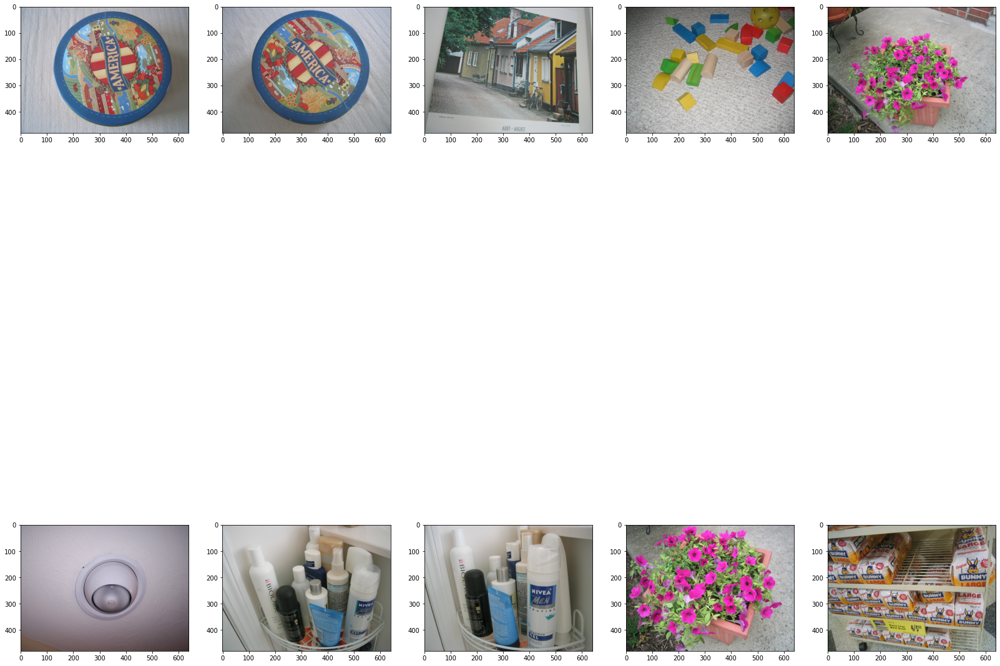

In [73]:
figure = plt.figure(figsize=(28, 28))
row, col = 2, 5

for idx, (diff, img_num) in enumerate(top_k, 1):
    figure.add_subplot(row, col, idx)
    plt.imshow(dataset[img_num])
plt.show()

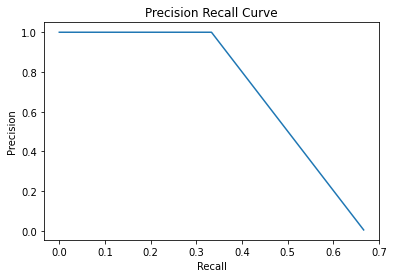

In [143]:
draw_pr_curve(dataset, [experiment_img], [1])

I suppose it is interesting to use another method for grouping results. Let's use median for this.

read 10 from 2000
read 20 from 2000
read 30 from 2000
read 40 from 2000
read 50 from 2000
read 60 from 2000
read 70 from 2000
read 80 from 2000
read 90 from 2000
read 100 from 2000
read 110 from 2000
read 120 from 2000
read 130 from 2000
read 140 from 2000
read 150 from 2000
read 160 from 2000
read 170 from 2000
read 180 from 2000
read 190 from 2000
read 200 from 2000
read 210 from 2000
read 220 from 2000
read 230 from 2000
read 240 from 2000
read 250 from 2000
read 260 from 2000
read 270 from 2000
read 280 from 2000
read 290 from 2000
read 300 from 2000
read 310 from 2000
read 320 from 2000
read 330 from 2000
read 340 from 2000
read 350 from 2000
read 360 from 2000
read 370 from 2000
read 380 from 2000
read 390 from 2000
read 400 from 2000
read 410 from 2000
read 420 from 2000
read 430 from 2000
read 440 from 2000
read 450 from 2000
read 460 from 2000
read 470 from 2000
read 480 from 2000
read 490 from 2000
read 500 from 2000
read 510 from 2000
read 520 from 2000
read 530 from 2000
re

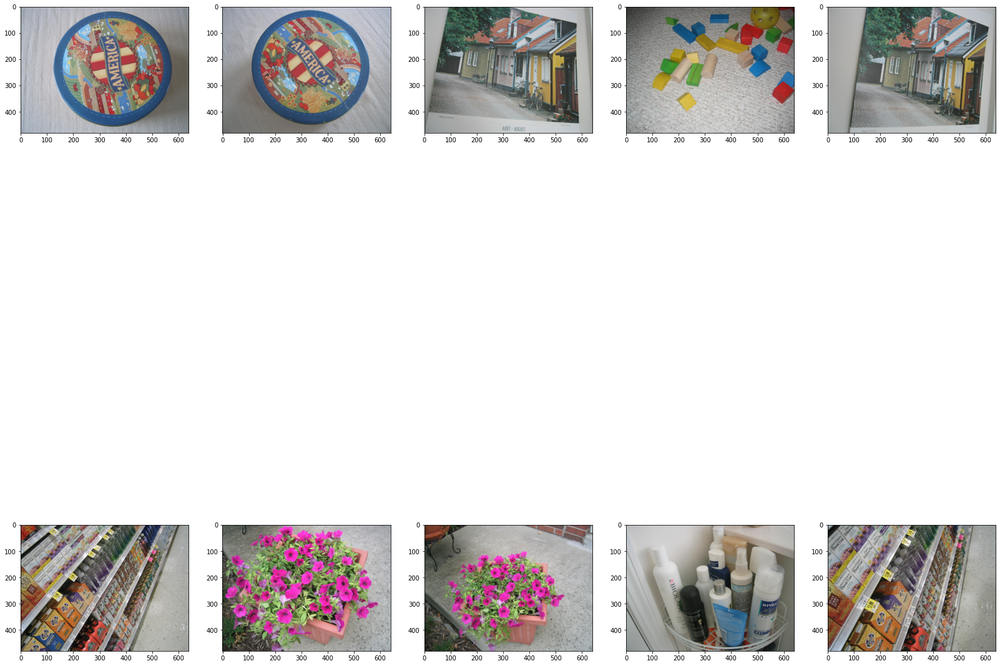

In [75]:
diff = get_diff(dataset, experiment_img, np.median)
top_k = fin_top_k(diff)

figure = plt.figure(figsize=(28, 28))
row, col = 2, 5

for idx, (diff, img_num) in enumerate(top_k, 1):
    figure.add_subplot(row, col, idx)
    plt.imshow(dataset[img_num])
plt.show()

We can see that top 10 images are not the same but over all images pretty similar and first two images are the same.

Let's make the same experiment for next image 

/var/folders/h2/s6rq_mhx67n824_sv70qztxc0000gn/T/ipykernel_1557/1781875124.py:4: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  return cv2.cvtColor(cv2.imdecode(np.fromstring(img_bytes.read(), np.uint8), cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)


read 10 from 2000
read 20 from 2000
read 30 from 2000
read 40 from 2000
read 50 from 2000
read 60 from 2000
read 70 from 2000
read 80 from 2000
read 90 from 2000
read 100 from 2000
read 110 from 2000
read 120 from 2000
read 130 from 2000
read 140 from 2000
read 150 from 2000
read 160 from 2000
read 170 from 2000
read 180 from 2000
read 190 from 2000
read 200 from 2000
read 210 from 2000
read 220 from 2000
read 230 from 2000
read 240 from 2000
read 250 from 2000
read 260 from 2000
read 270 from 2000
read 280 from 2000
read 290 from 2000
read 300 from 2000
read 310 from 2000
read 320 from 2000
read 330 from 2000
read 340 from 2000
read 350 from 2000
read 360 from 2000
read 370 from 2000
read 380 from 2000
read 390 from 2000
read 400 from 2000
read 410 from 2000
read 420 from 2000
read 430 from 2000
read 440 from 2000
read 450 from 2000
read 460 from 2000
read 470 from 2000
read 480 from 2000
read 490 from 2000
read 500 from 2000
read 510 from 2000
read 520 from 2000
read 530 from 2000
re

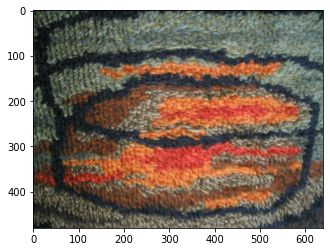

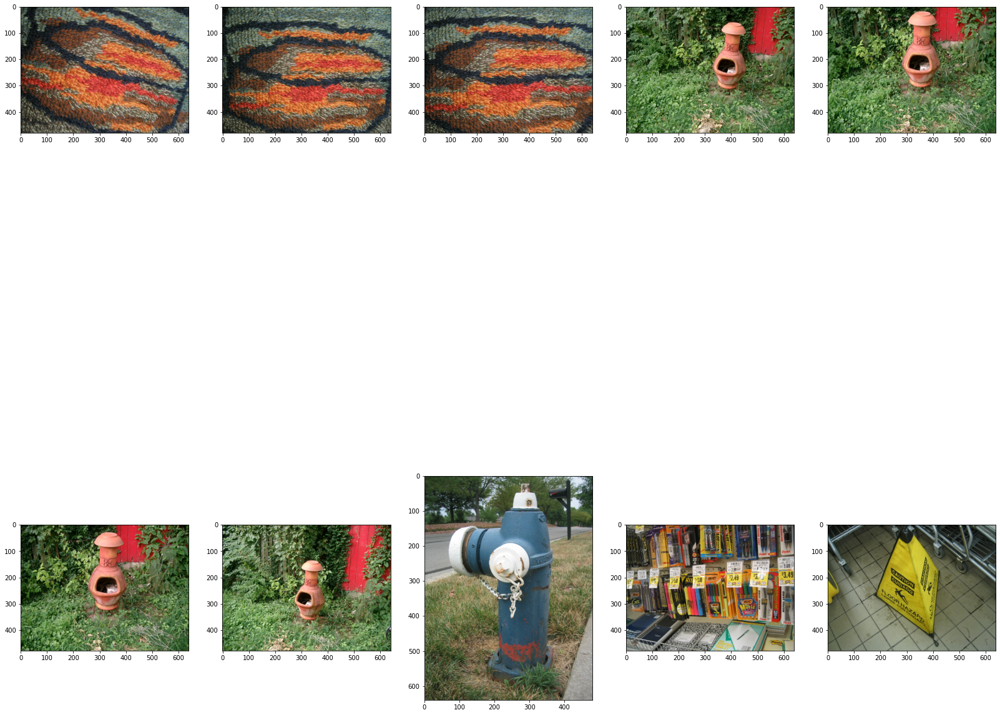

In [76]:
experiment_img = read_img(url40)
diff = get_diff(dataset, experiment_img, np.mean)
top_k = fin_top_k(diff)
plt.imshow(experiment_img)

figure = plt.figure(figsize=(28, 28))
row, col = 2, 5

for idx, (diff, img_num) in enumerate(top_k, 1):
    figure.add_subplot(row, col, idx)
    plt.imshow(dataset[img_num])
plt.show()

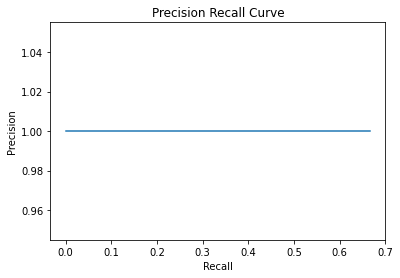

In [148]:
draw_pr_curve(dataset, [experiment_img], [10])

At this example we can see even better examples, first 3 images are the same. Next images visually has similar colors.

/var/folders/h2/s6rq_mhx67n824_sv70qztxc0000gn/T/ipykernel_1557/1781875124.py:4: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  return cv2.cvtColor(cv2.imdecode(np.fromstring(img_bytes.read(), np.uint8), cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)


read 10 from 2000
read 20 from 2000
read 30 from 2000
read 40 from 2000
read 50 from 2000
read 60 from 2000
read 70 from 2000
read 80 from 2000
read 90 from 2000
read 100 from 2000
read 110 from 2000
read 120 from 2000
read 130 from 2000
read 140 from 2000
read 150 from 2000
read 160 from 2000
read 170 from 2000
read 180 from 2000
read 190 from 2000
read 200 from 2000
read 210 from 2000
read 220 from 2000
read 230 from 2000
read 240 from 2000
read 250 from 2000
read 260 from 2000
read 270 from 2000
read 280 from 2000
read 290 from 2000
read 300 from 2000
read 310 from 2000
read 320 from 2000
read 330 from 2000
read 340 from 2000
read 350 from 2000
read 360 from 2000
read 370 from 2000
read 380 from 2000
read 390 from 2000
read 400 from 2000
read 410 from 2000
read 420 from 2000
read 430 from 2000
read 440 from 2000
read 450 from 2000
read 460 from 2000
read 470 from 2000
read 480 from 2000
read 490 from 2000
read 500 from 2000
read 510 from 2000
read 520 from 2000
read 530 from 2000
re

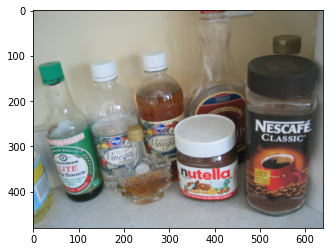

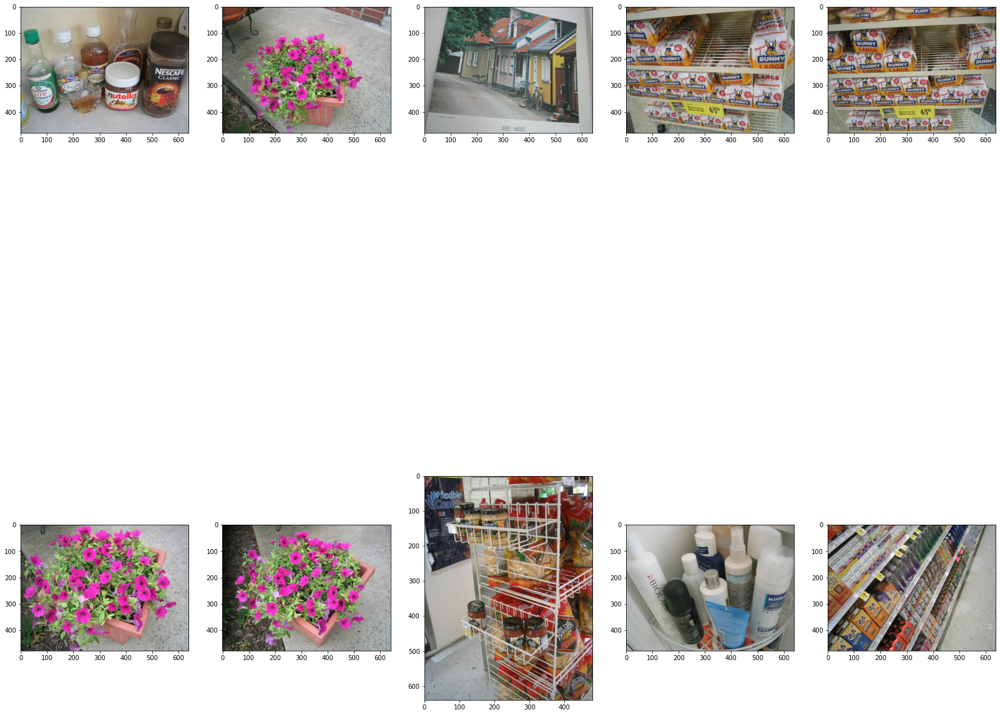

In [77]:
experiment_img = read_img(url60)
diff = get_diff(dataset, experiment_img, np.mean)
top_k = fin_top_k(diff)
plt.imshow(experiment_img)

figure = plt.figure(figsize=(28, 28))
row, col = 2, 5

for idx, (diff, img_num) in enumerate(top_k, 1):
    figure.add_subplot(row, col, idx)
    plt.imshow(dataset[img_num])
plt.show()

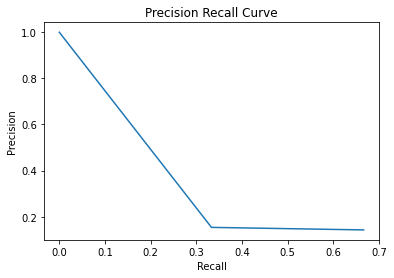

In [151]:
draw_pr_curve(dataset, [experiment_img], [15])

From this experiment interesting is the next, from one side the most similar image has the same content. Another regularity is that we have stack of the same images inside the top 10 list.

/var/folders/h2/s6rq_mhx67n824_sv70qztxc0000gn/T/ipykernel_1557/1781875124.py:4: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  return cv2.cvtColor(cv2.imdecode(np.fromstring(img_bytes.read(), np.uint8), cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)


read 10 from 2000
read 20 from 2000
read 30 from 2000
read 40 from 2000
read 50 from 2000
read 60 from 2000
read 70 from 2000
read 80 from 2000
read 90 from 2000
read 100 from 2000
read 110 from 2000
read 120 from 2000
read 130 from 2000
read 140 from 2000
read 150 from 2000
read 160 from 2000
read 170 from 2000
read 180 from 2000
read 190 from 2000
read 200 from 2000
read 210 from 2000
read 220 from 2000
read 230 from 2000
read 240 from 2000
read 250 from 2000
read 260 from 2000
read 270 from 2000
read 280 from 2000
read 290 from 2000
read 300 from 2000
read 310 from 2000
read 320 from 2000
read 330 from 2000
read 340 from 2000
read 350 from 2000
read 360 from 2000
read 370 from 2000
read 380 from 2000
read 390 from 2000
read 400 from 2000
read 410 from 2000
read 420 from 2000
read 430 from 2000
read 440 from 2000
read 450 from 2000
read 460 from 2000
read 470 from 2000
read 480 from 2000
read 490 from 2000
read 500 from 2000
read 510 from 2000
read 520 from 2000
read 530 from 2000
re

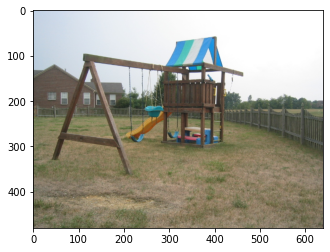

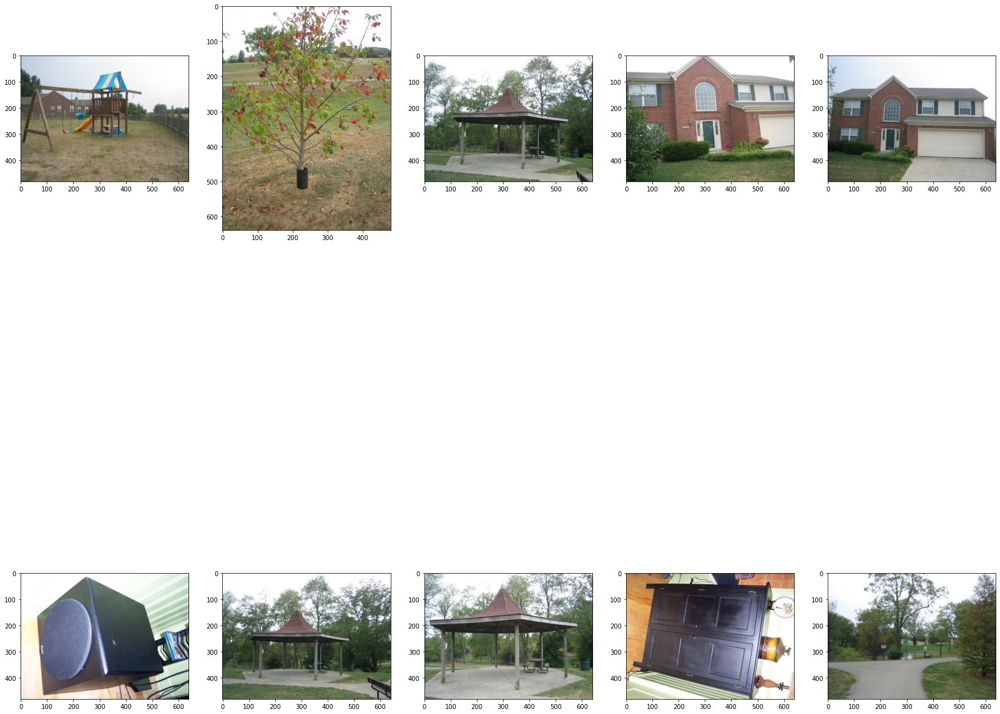

In [78]:
experiment_img = read_img(url588)
diff = get_diff(dataset, experiment_img, np.mean)
top_k = fin_top_k(diff)
plt.imshow(experiment_img)

figure = plt.figure(figsize=(28, 28))
row, col = 2, 5

for idx, (diff, img_num) in enumerate(top_k, 1):
    figure.add_subplot(row, col, idx)
    plt.imshow(dataset[img_num])
plt.show()

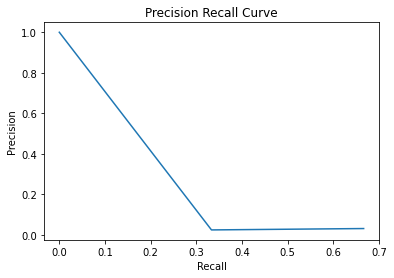

In [171]:
draw_pr_curve(dataset, [experiment_img], [147])

This experiment even better shows that we comparing the distributions of colors but not the context and object at the image.

/var/folders/h2/s6rq_mhx67n824_sv70qztxc0000gn/T/ipykernel_1557/1781875124.py:4: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  return cv2.cvtColor(cv2.imdecode(np.fromstring(img_bytes.read(), np.uint8), cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)


read 10 from 2000
read 20 from 2000
read 30 from 2000
read 40 from 2000
read 50 from 2000
read 60 from 2000
read 70 from 2000
read 80 from 2000
read 90 from 2000
read 100 from 2000
read 110 from 2000
read 120 from 2000
read 130 from 2000
read 140 from 2000
read 150 from 2000
read 160 from 2000
read 170 from 2000
read 180 from 2000
read 190 from 2000
read 200 from 2000
read 210 from 2000
read 220 from 2000
read 230 from 2000
read 240 from 2000
read 250 from 2000
read 260 from 2000
read 270 from 2000
read 280 from 2000
read 290 from 2000
read 300 from 2000
read 310 from 2000
read 320 from 2000
read 330 from 2000
read 340 from 2000
read 350 from 2000
read 360 from 2000
read 370 from 2000
read 380 from 2000
read 390 from 2000
read 400 from 2000
read 410 from 2000
read 420 from 2000
read 430 from 2000
read 440 from 2000
read 450 from 2000
read 460 from 2000
read 470 from 2000
read 480 from 2000
read 490 from 2000
read 500 from 2000
read 510 from 2000
read 520 from 2000
read 530 from 2000
re

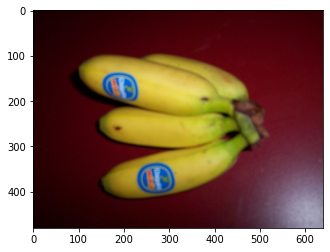

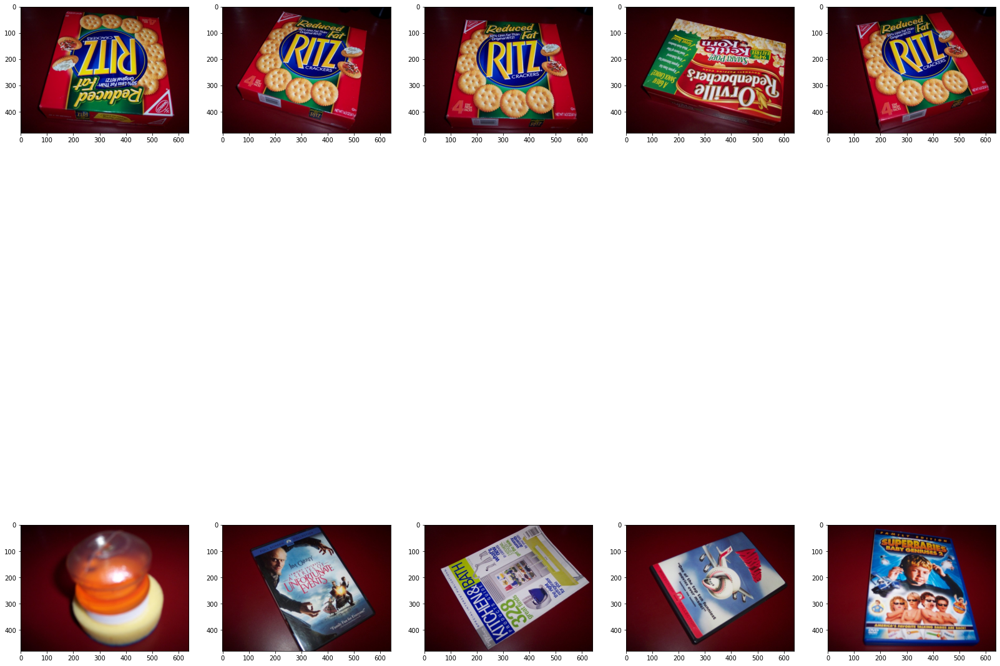

In [79]:
experiment_img = read_img(ur1562)
diff = get_diff(dataset, experiment_img, np.mean)
top_k = fin_top_k(diff)
plt.imshow(experiment_img)

figure = plt.figure(figsize=(28, 28))
row, col = 2, 5

for idx, (diff, img_num) in enumerate(top_k, 1):
    figure.add_subplot(row, col, idx)
    plt.imshow(dataset[img_num])
plt.show()

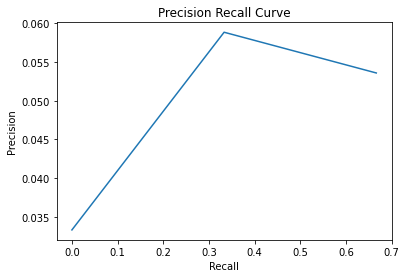

In [190]:
draw_pr_curve(dataset, [experiment_img], [390])

The picture above shows the failure case of this matching system.

Conclusion

We could see that the approach above could be used to find similar images. Obvious that this method has weak and strong sides. First of all it is pretty easy to implement and maybe as base line we could use such approach. Important to understand that we do not take into account the pixels pattern and image structure. From this, the main weak part is that we could detect similar images with different content. For example, the last experiment clearly displayed that the most impact has backround, as it takes a lot of image area, and when the size of object is small we match wrong images. This method is also sensetive to the scale, when the colors distributions change a lot.